In [1]:
import sys,os

try:
    from localgraphclustering import *
except:
    # when the package is not installed, import the local version instead. 
    # the notebook must be placed in the original "notebooks/" folder
    sys.path.append("../")
    from localgraphclustering import *

import time
import numpy as np

# Import the graph_tool module for visualization.
from graph_tool.all import * 

# Import matplotlib 
import matplotlib.pyplot as plt

# Just a useful function.
def diff(a, b):
        b = set(b)
        return np.asarray([aa for aa in a if aa not in b], dtype = 'int64')

# Load graph for localgraphclustering package

In [2]:
# Read graph. This also supports gml format.
g = GraphLocal('./datasets/Colgate88_reduced.graphml','graphml','\t')

/usr/local/lib/python3.6/site-packages/localgraphclustering/GraphLocal.py:203: UserWarning:

Loading a graphml is not efficient, we suggest using an edgelist format for this API.



# Load graph using graph-tool in order to extract graph attributes as well.

In [3]:
# Add data to graphtool.
g_gtool = load_graph("./datasets/Colgate88_reduced.graphml")
    
remove_self_loops(g_gtool)

# Load coordinates for visualization

In [4]:
# Load pre-computed coordinates for nodes.
g_gtool_x = g_gtool.vertex_properties.x
g_gtool_y = g_gtool.vertex_properties.y

pos = g_gtool.new_vertex_property("vector<double>")
for i in g_gtool.get_vertices():
    pos[i] = [g_gtool_x[i],g_gtool_y[i]]

# Extract "ground truth" cluster, i.e., students of year 2008

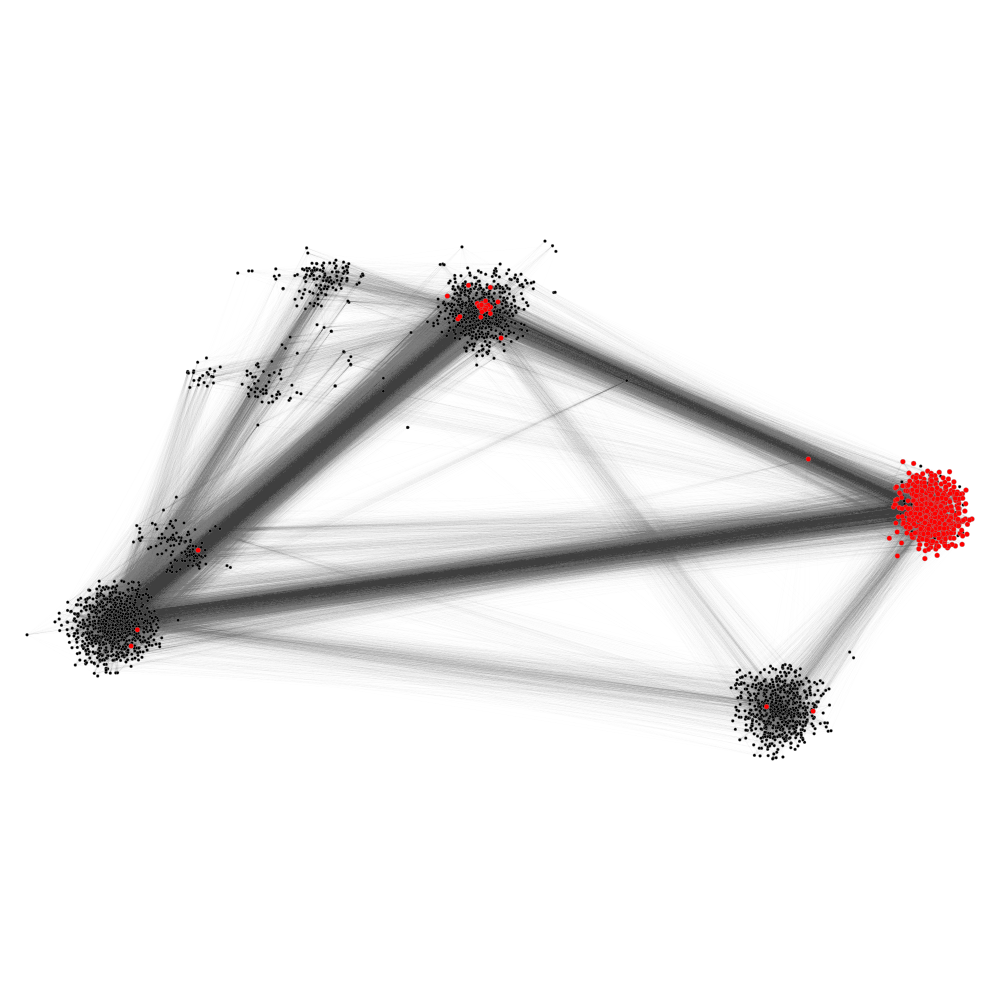

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x141b76908, at 0x141885be0>

In [5]:
# For details about the "ground truth" cluster please refer to: D. Wang, K. Fountoulakis, M. Henzinger, 
# M. Mahoney and S. Rao. Capacity Releasing Diffusion for Speed and Locality. ICML 2017.

g_gtool_year = g_gtool.vertex_properties.year

students_2008 = []
for i in g_gtool.get_vertices():
    if g_gtool_year[i] == 2008:
        students_2008.append(i)

# Visualize students of of year 2008.
temp = np.zeros(g._num_vertices) + 3

temp[students_2008] = 5

node_size = g_gtool.new_vertex_property("double",temp)

temp = ["black" for x in range(g._num_vertices)]

for i in students_2008:
    temp[i] = "red"

node_colours = g_gtool.new_vertex_property("string",temp)  

c_map = plt.get_cmap('autumn')
    
graph_draw(g_gtool, pos, output_size=(1000, 1000),
           vertex_size=node_size, 
           vertex_fill_color=node_colours, 
           vorder=node_size,
           edge_pen_width=0.1,
           edge_color = [0.0, 0, 0, 0.05],
           vcmap=c_map)

# Run flow-based algorithm Capacity Releasing Diffusion

CRD iteration:  1
precision: 1.0
recall:  0.0016017940092904052


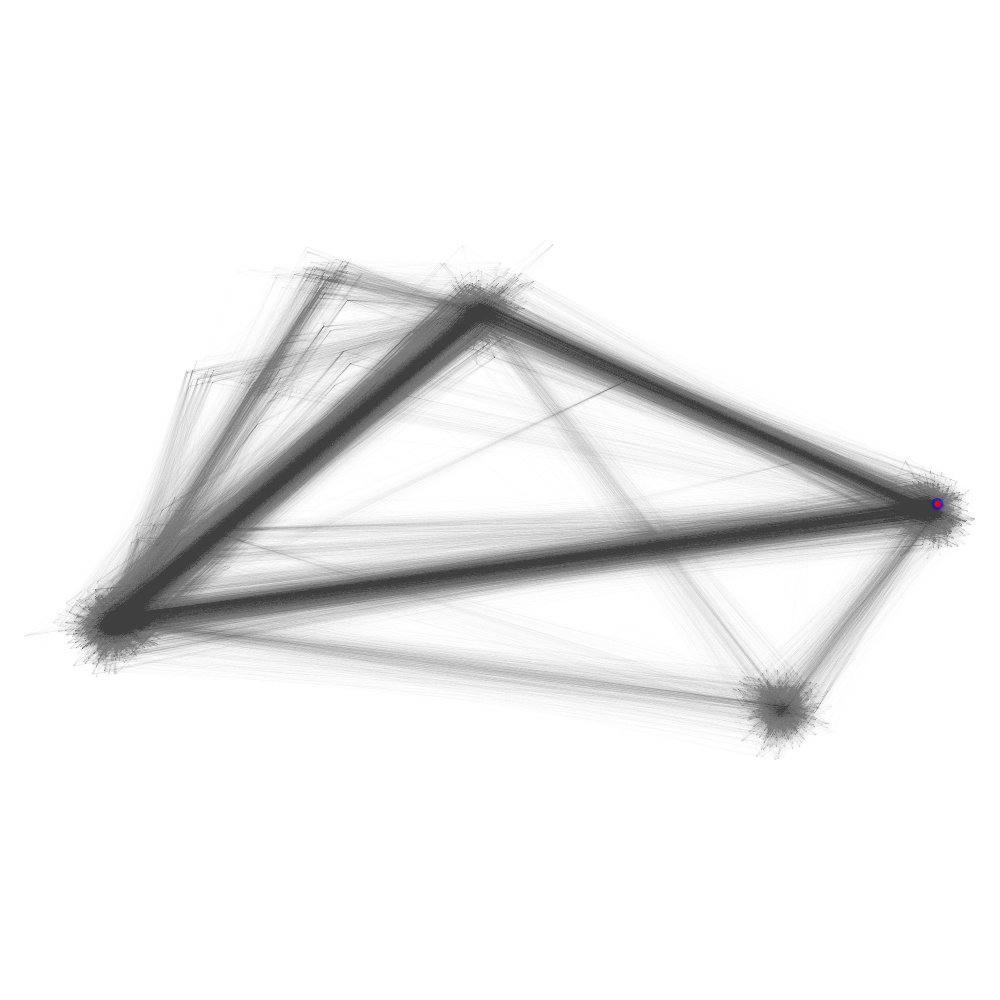

CRD iteration:  2
precision: 1.0
recall:  0.0016017940092904052


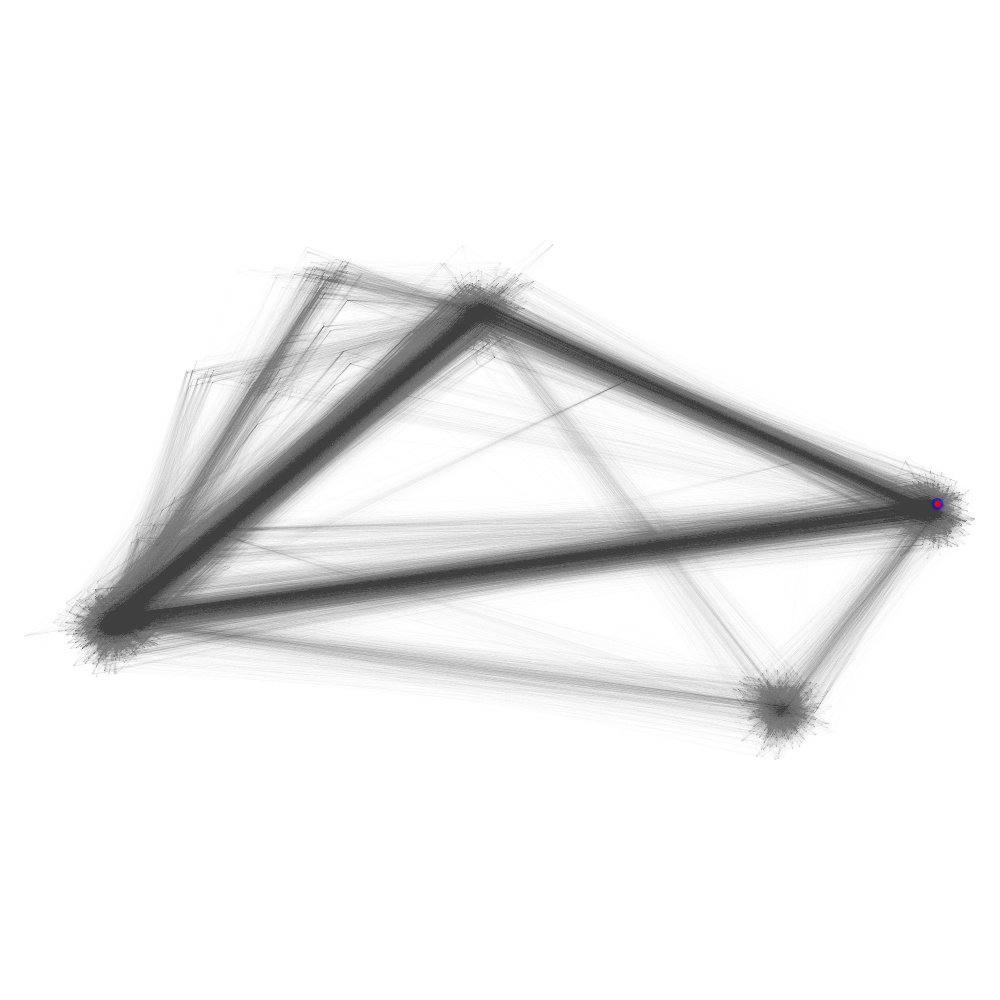

CRD iteration:  3
precision: 1.0
recall:  0.0016017940092904052


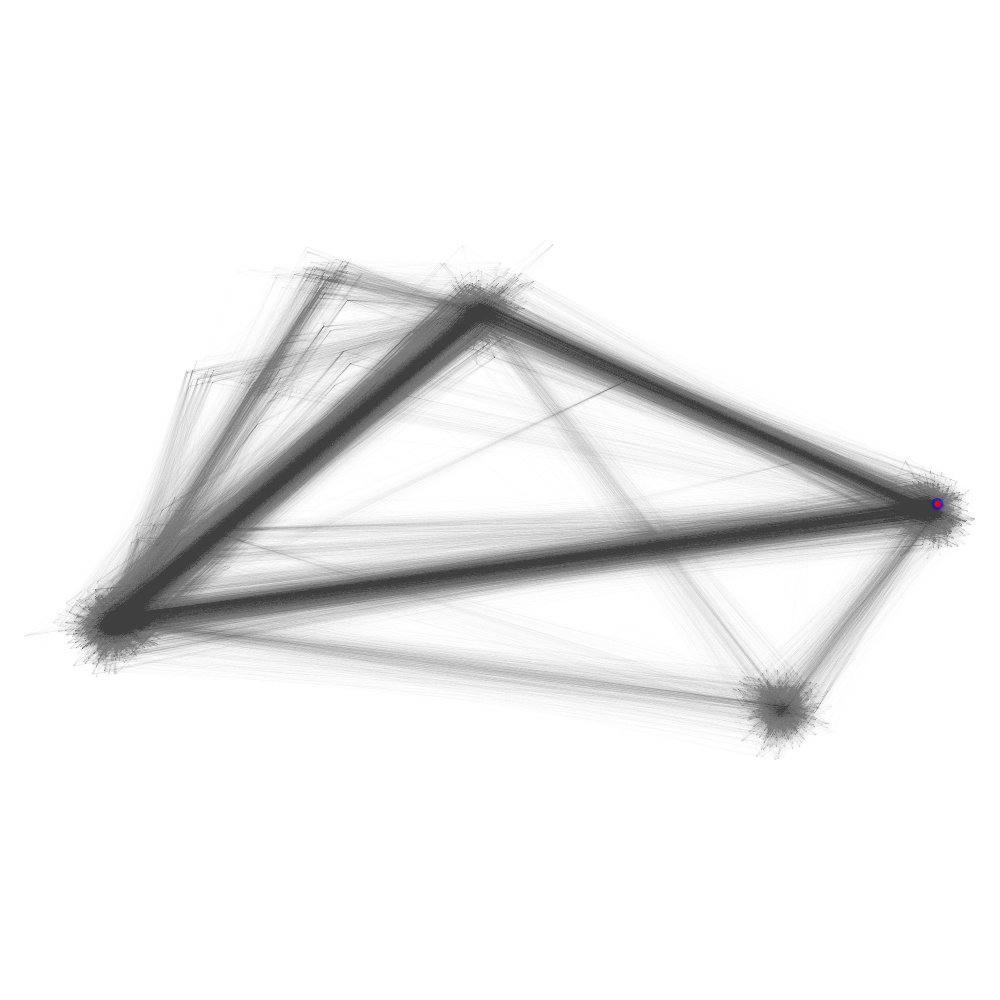

CRD iteration:  4
precision: 1.0
recall:  0.0016017940092904052


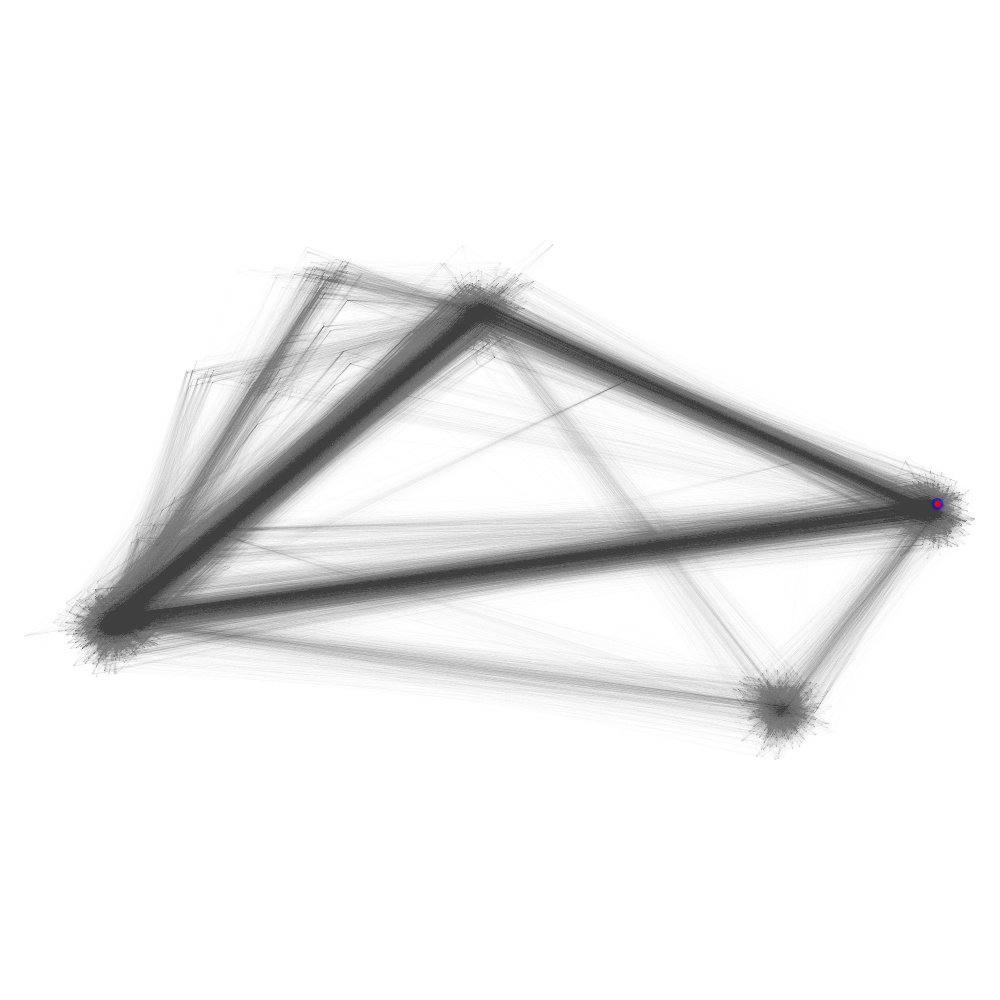

CRD iteration:  5
precision: 1.0
recall:  0.0019541886913342944


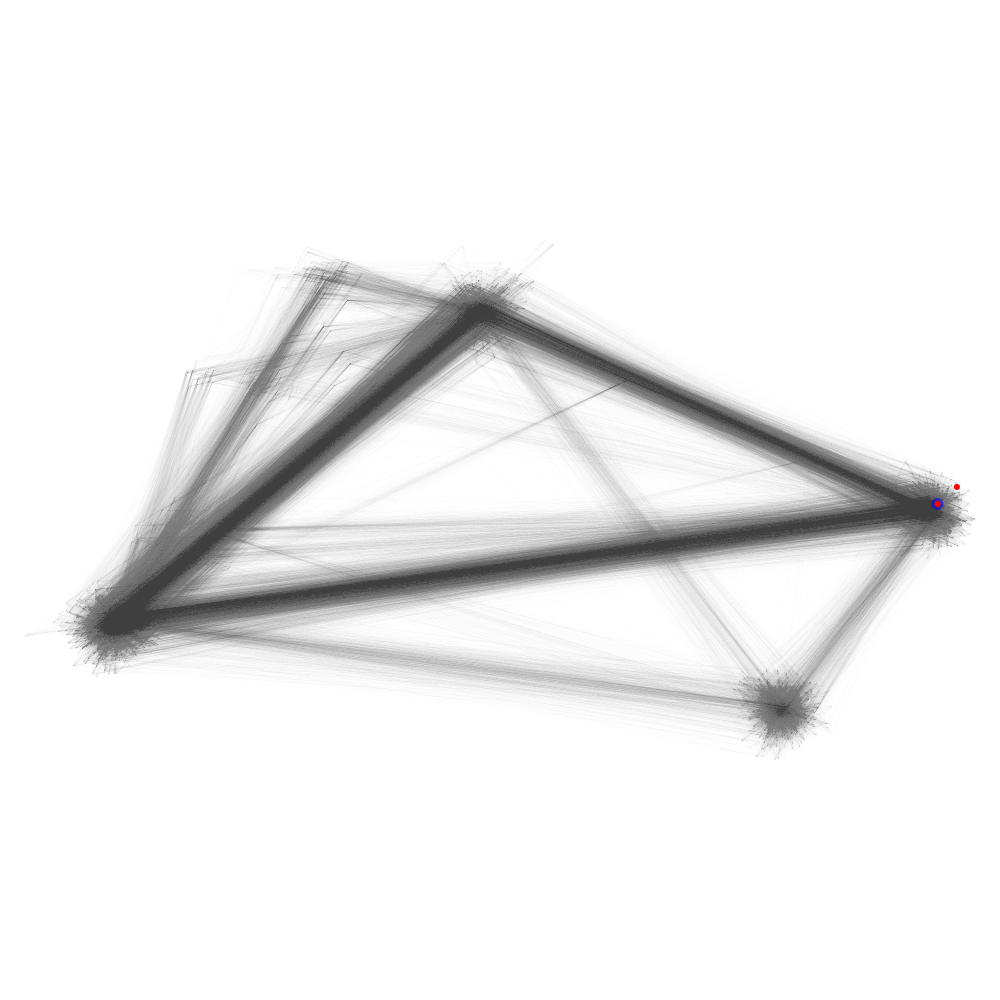

CRD iteration:  6
precision: 0.9161793372319688
recall:  0.007528431843664905


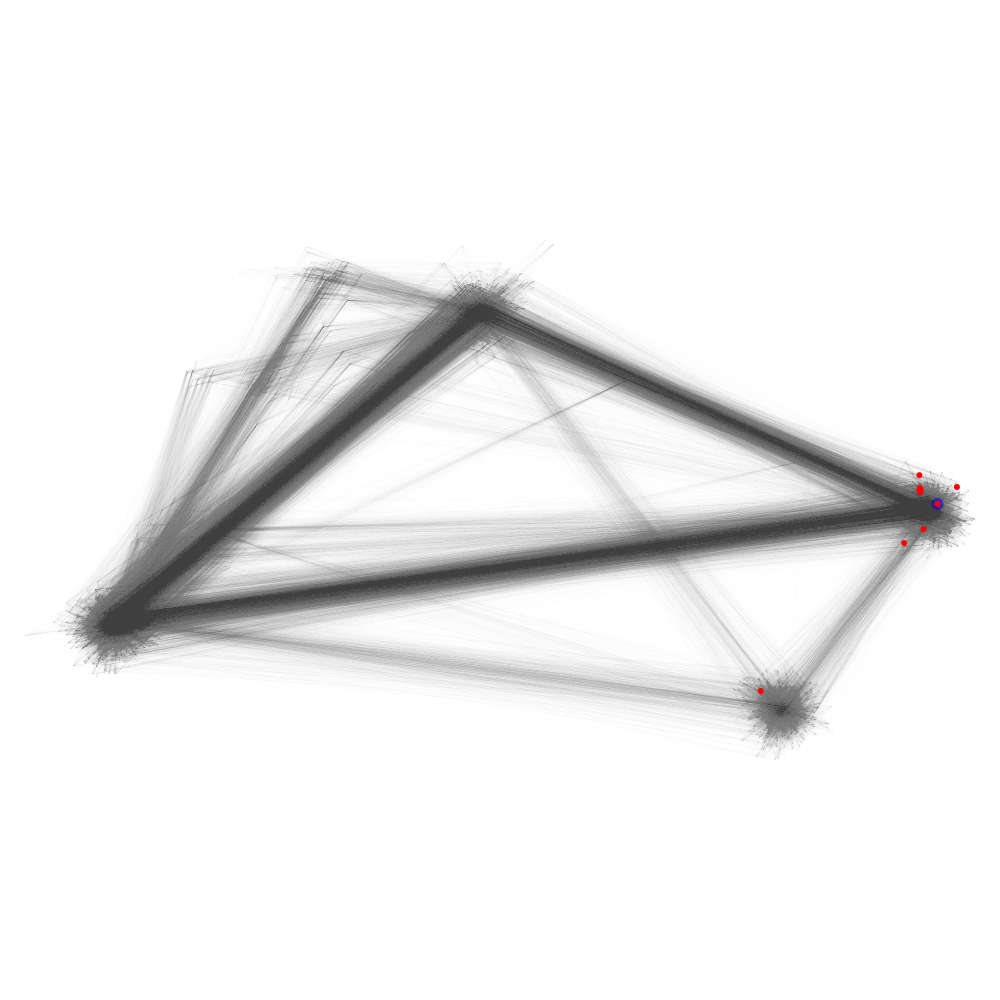

CRD iteration:  7
precision: 0.9399771341463414
recall:  0.07901649847829569


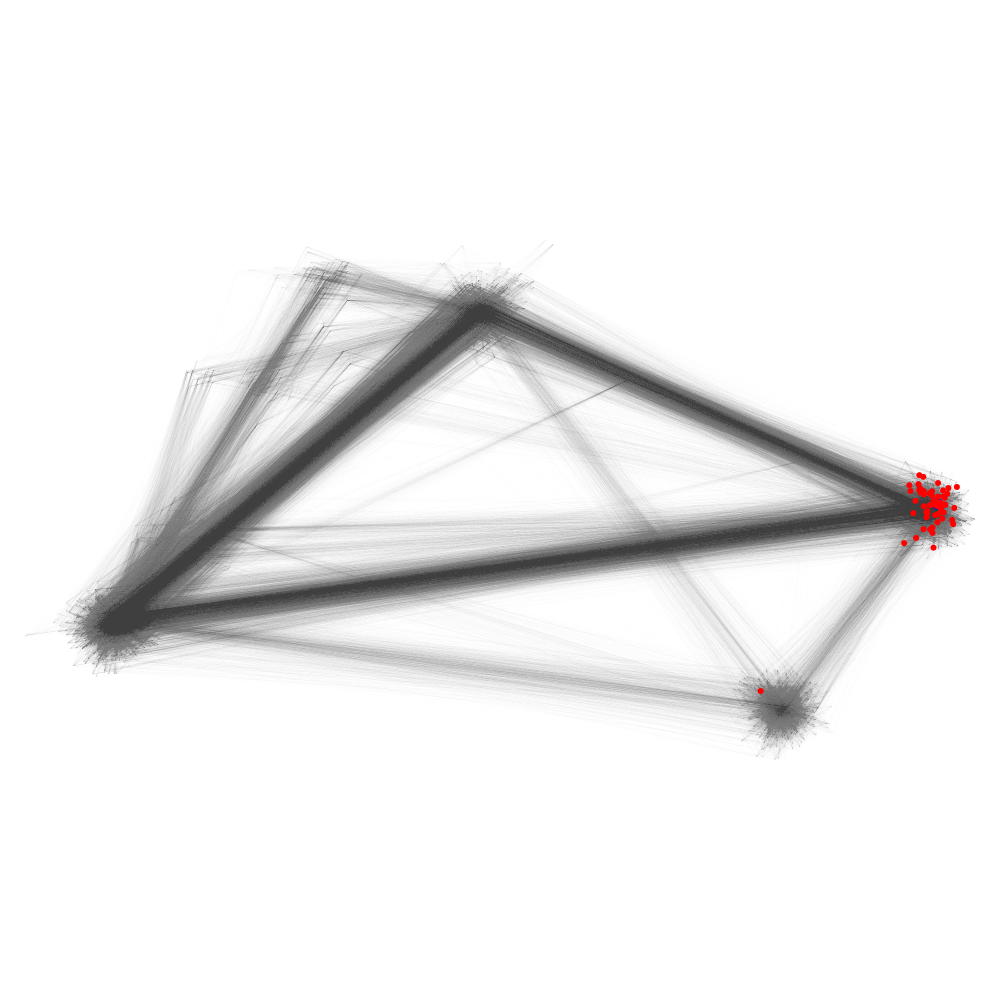

CRD iteration:  8
precision: 0.9096713907491045
recall:  0.18712157616530514


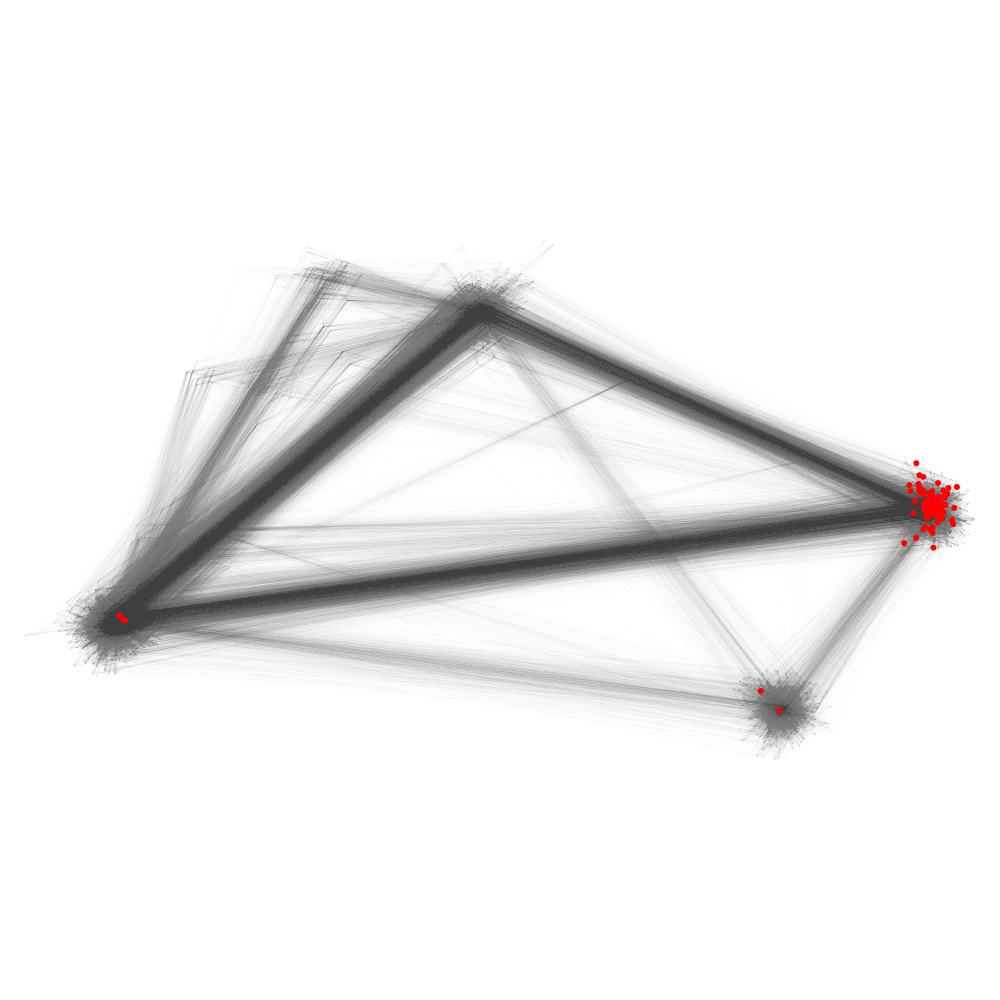

CRD iteration:  9
precision: 0.8981218274111675
recall:  0.2834054140637514


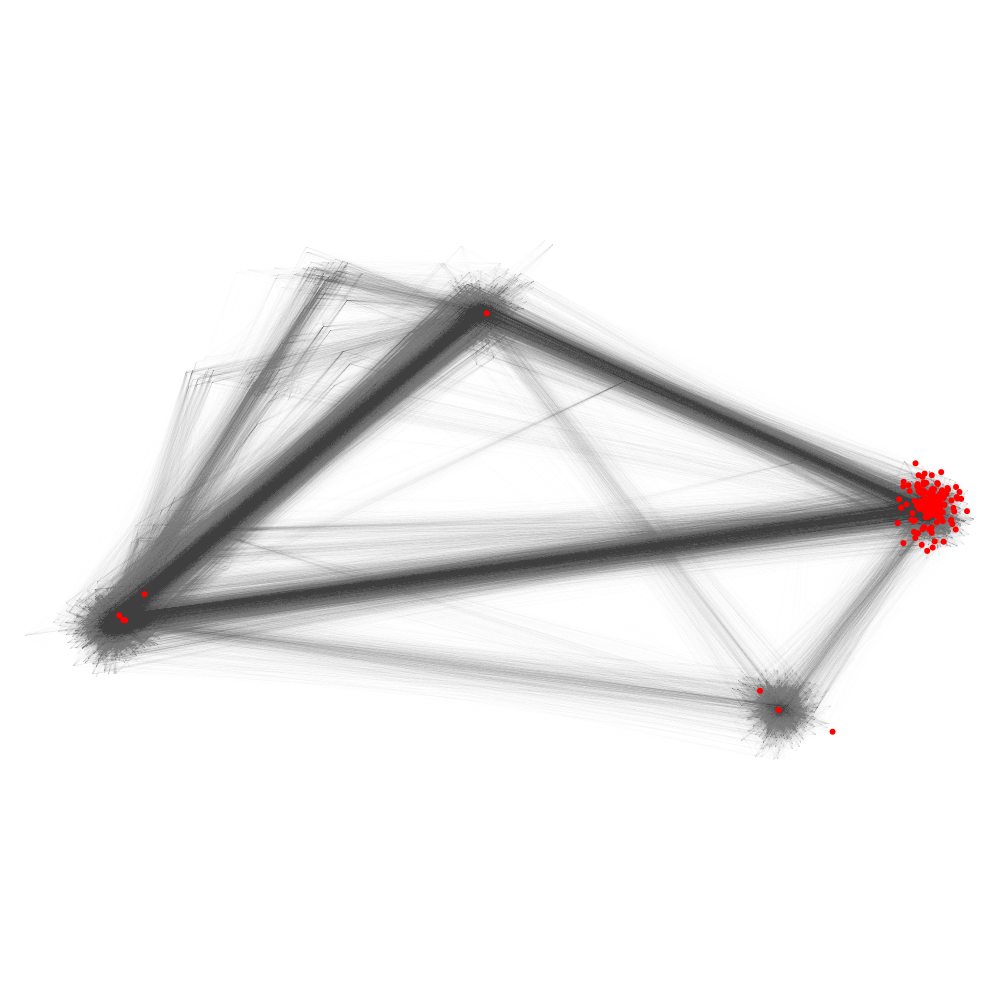

CRD iteration:  10
precision: 0.8754984655530441
recall:  0.7631267019061349


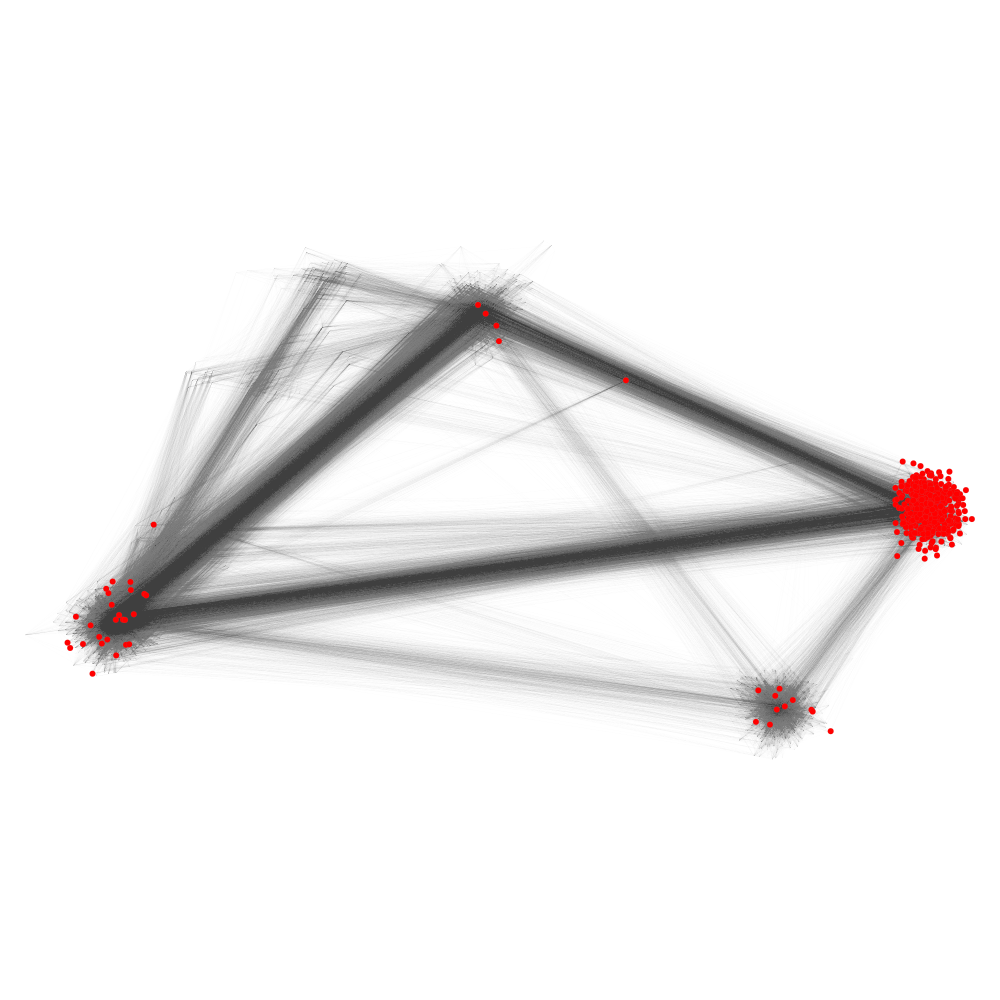

CRD iteration:  11
precision: 0.9521891730150258
recall:  0.9429921512093544


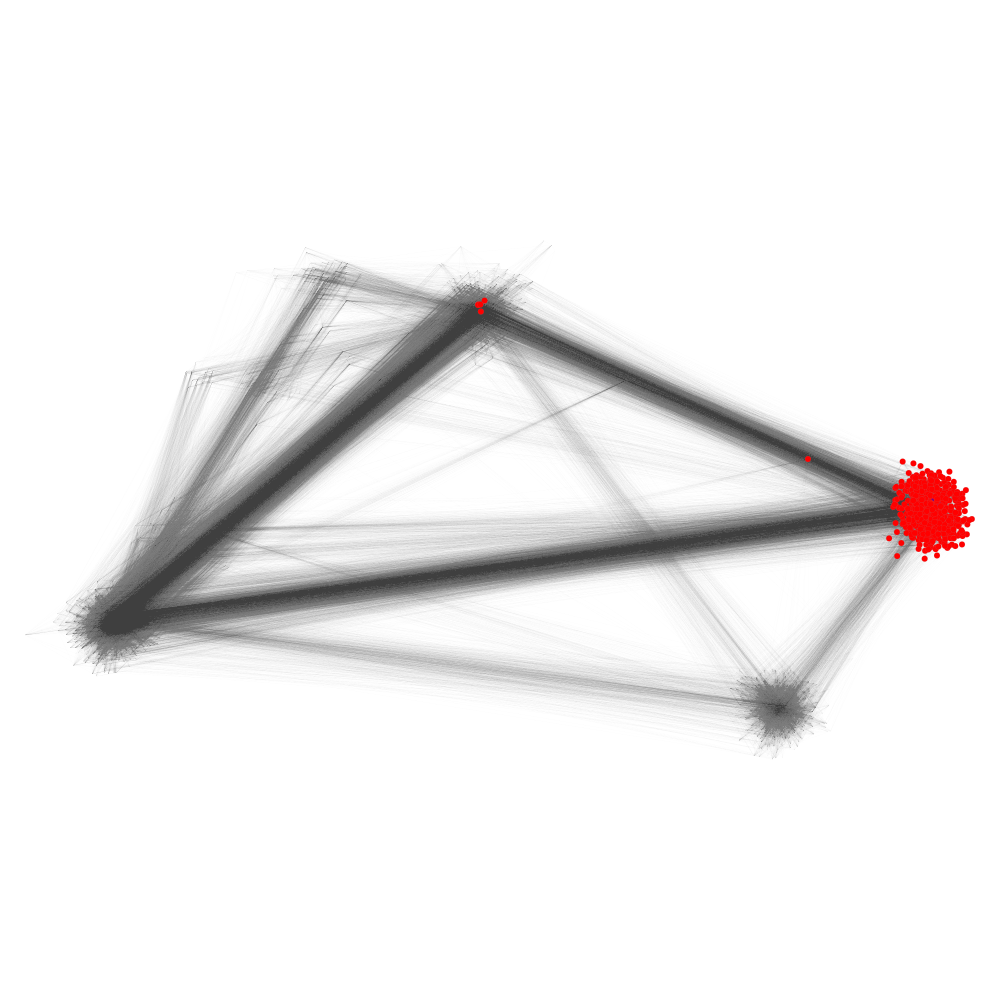

CRD iteration:  12
precision: 0.9521891730150258
recall:  0.9429921512093544


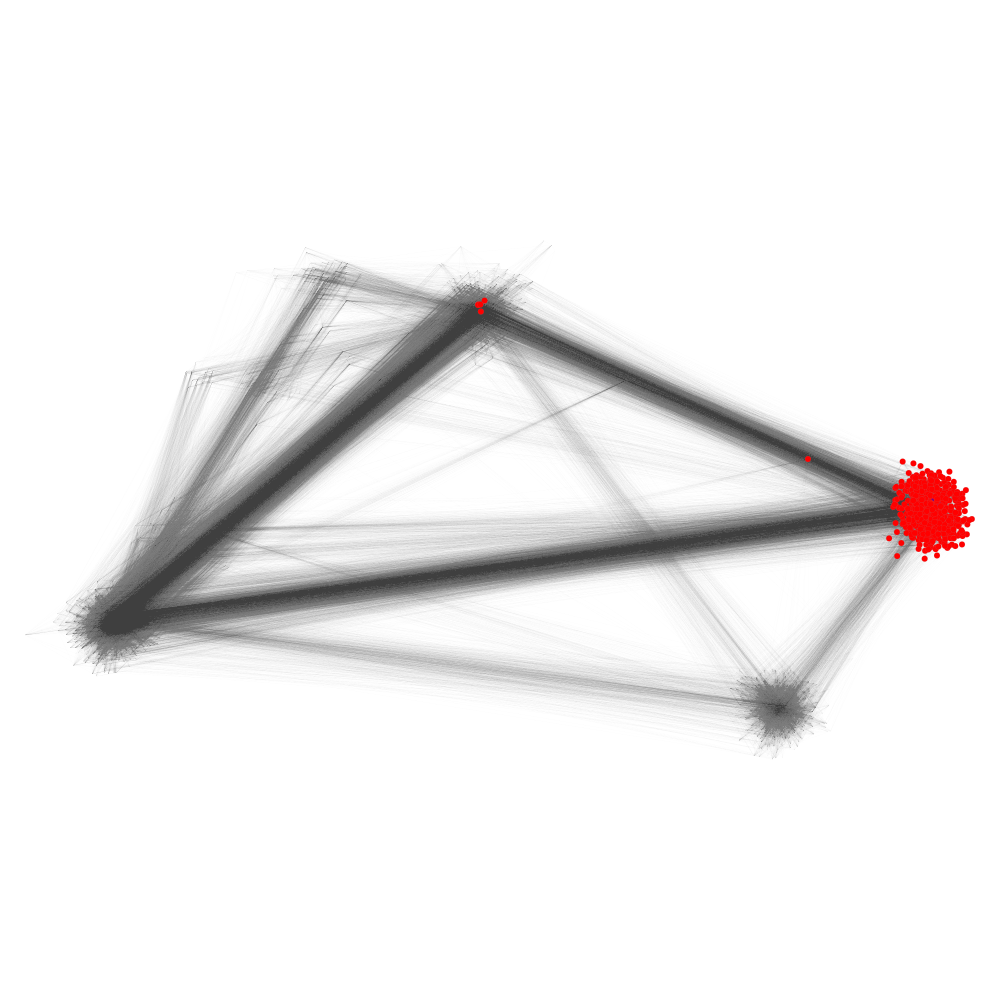

CRD iteration:  13
precision: 0.9521891730150258
recall:  0.9429921512093544


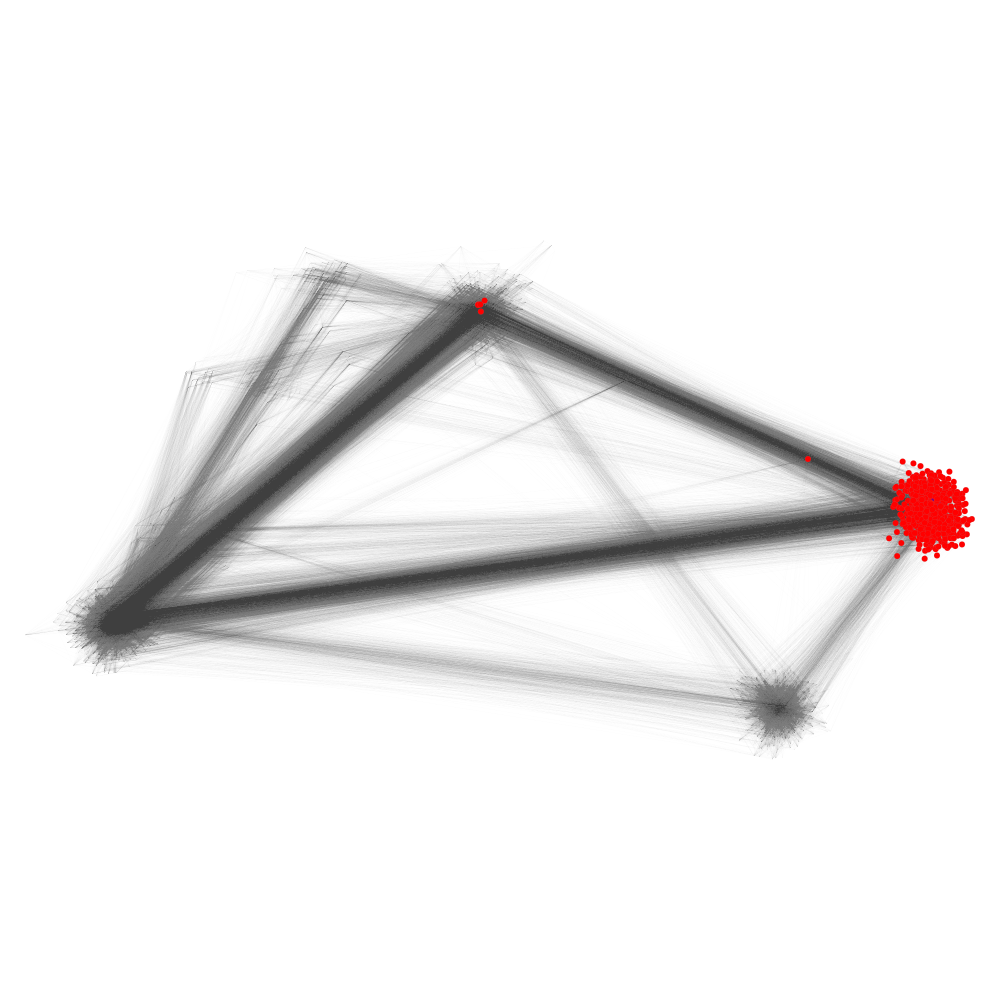

In [6]:
ref_node = [3344]

for iterations in range(13):

    # Run the algorithm
    output_crd_fast = capacity_releasing_diffusion(g,ref_node,iterations = iterations + 1)
    
    output_crd_fast = output_crd_fast[0]
    
    # Measure accuracy
    true_positives = set(students_2008).intersection(output_crd_fast)
    if len(true_positives) == 0:
        true_positives = set(ref_node)
        vol = g.d[ref_node]
    else:
        vol = sum(g.d[output_crd_fast])   
    precision_ex = sum(g.d[np.array(list(true_positives))])/vol
    recall_ex = sum(g.d[np.array(list(true_positives))])/sum(g.d[students_2008])
    print("CRD iteration: ", iterations + 1)
    print("precision:", precision_ex)
    print("recall: ", recall_ex)
    
    # Visualize the results.
    temp = np.zeros(g._num_vertices) + 0.00001

    temp[output_crd_fast] = 6

    node_size = g_gtool.new_vertex_property("double",temp)

    temp = ["black" for x in range(g._num_vertices)]

    for i in output_crd_fast:
        temp[i] = "red"

    node_colours = g_gtool.new_vertex_property("string",temp)  

    halo = np.zeros(g._num_vertices, dtype=bool)
    halo[ref_node] = True
    node_halo = g_gtool.new_vertex_property("bool",halo)

    c_map = plt.get_cmap('autumn')
    
    graph_draw(g_gtool, pos, output_size=(1000, 1000),
               vertex_size=node_size, 
               vertex_fill_color=node_colours, 
               vertex_halo=node_halo,
               vertex_halo_size = 2.0,
               vorder=node_size,
               edge_pen_width=0.1,
               edge_color = [0.0, 0, 0, 0.05],
               vcmap=c_map)

# Run spectral-based method, l1-regularized PageRank

Teleportation parameter:  0.0001
precision: 0.4022824076759007
recall:  0.9999839820599071


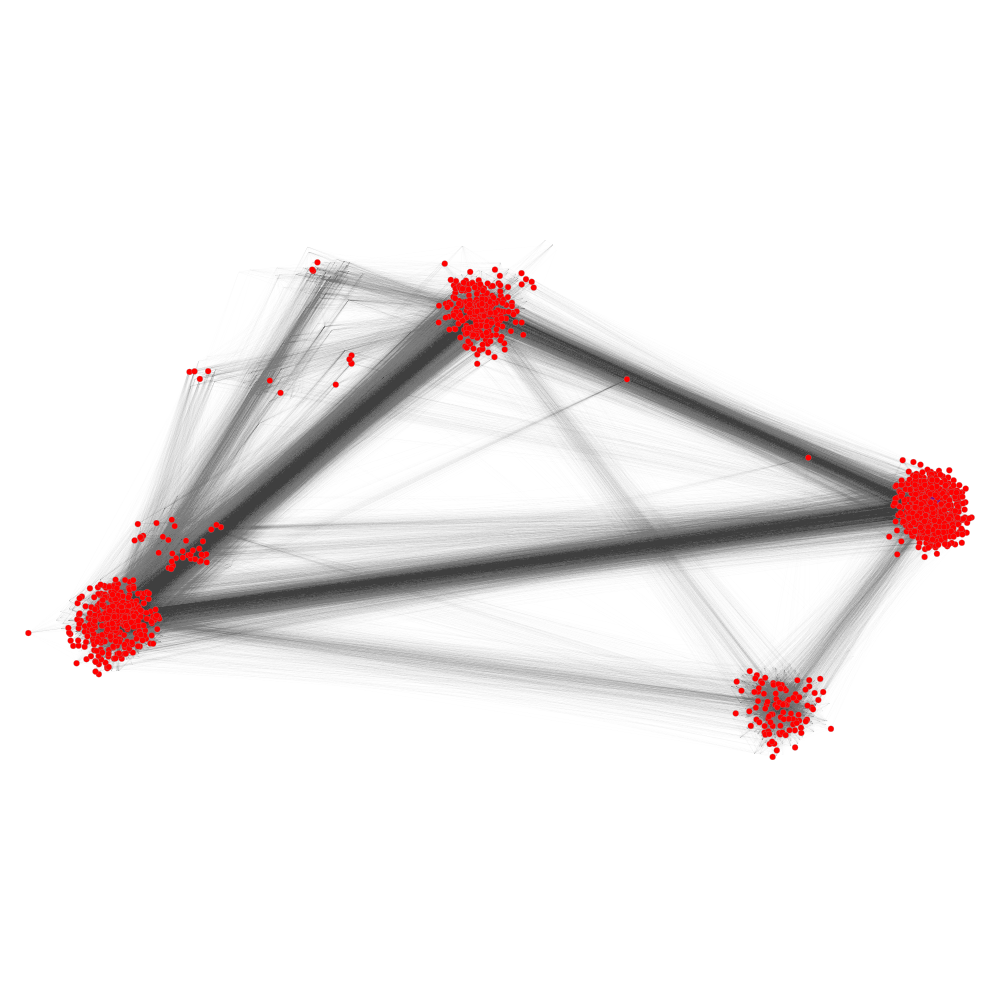

Teleportation parameter:  0.001
precision: 0.4017620408268335
recall:  0.9999839820599071


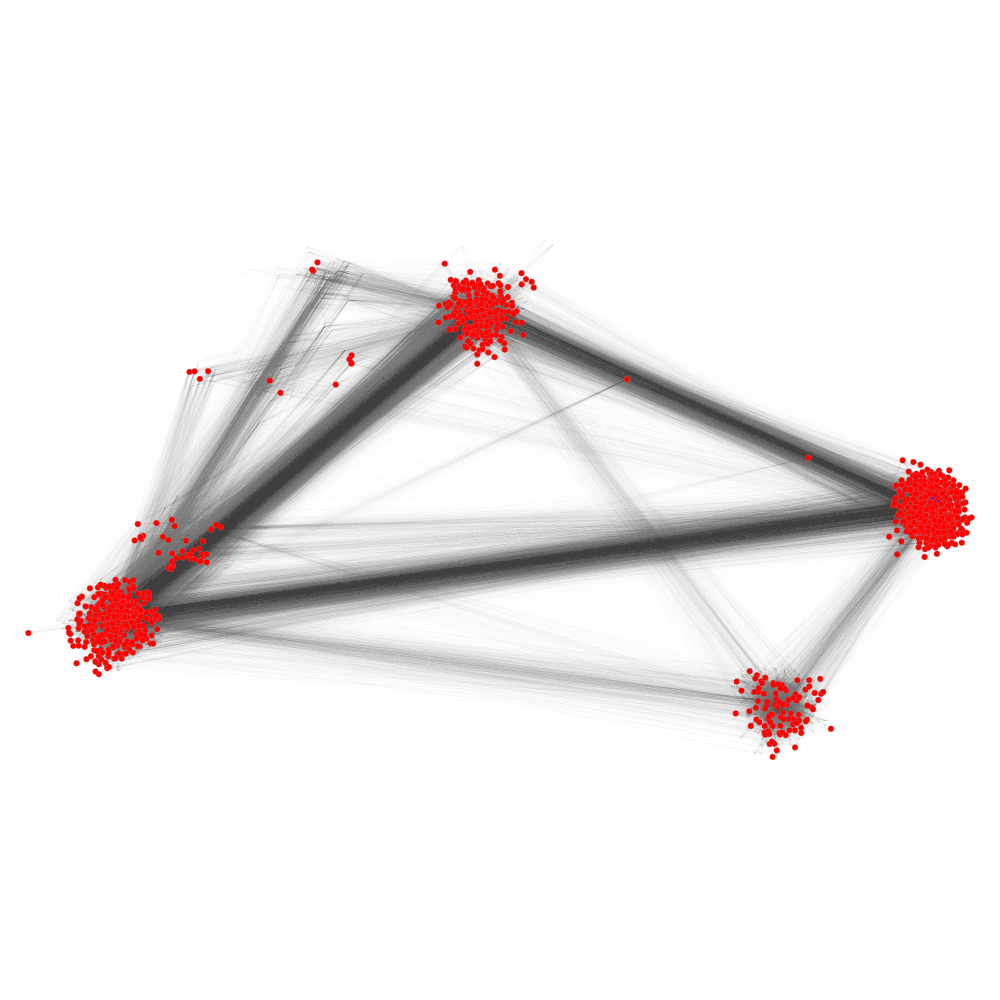

Teleportation parameter:  0.01
precision: 0.40258366601956774
recall:  0.9998558385391638


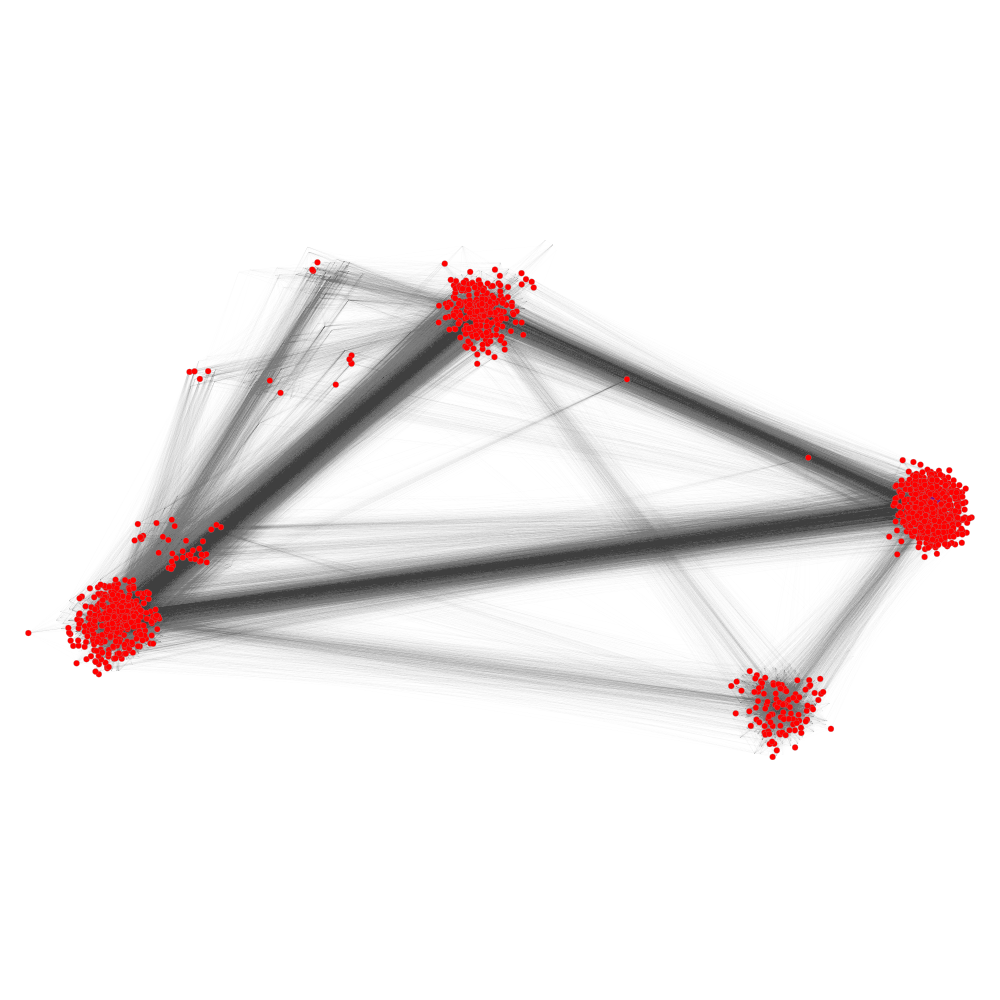

Teleportation parameter:  0.1
precision: 0.40246450265021083
recall:  0.9997597308986065


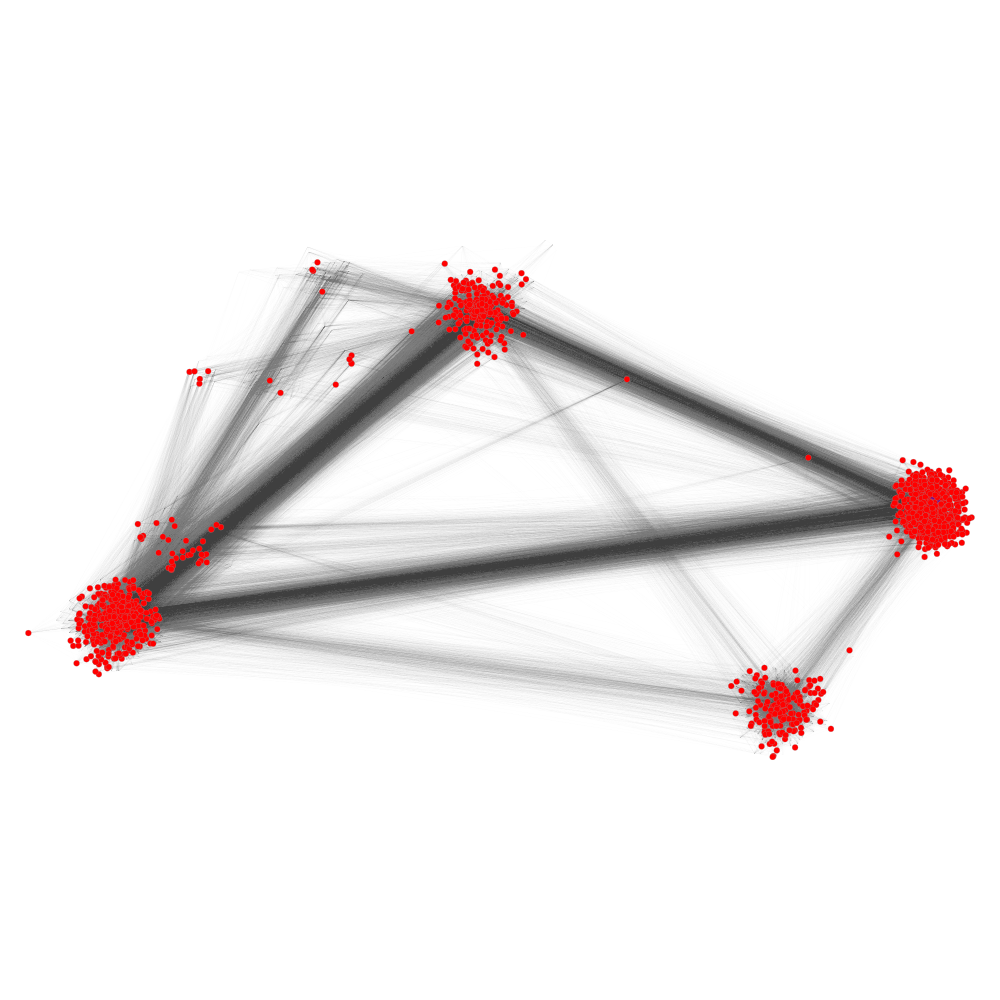

Teleportation parameter:  0.2
precision: 0.8272681676326349
recall:  0.9511132468364568


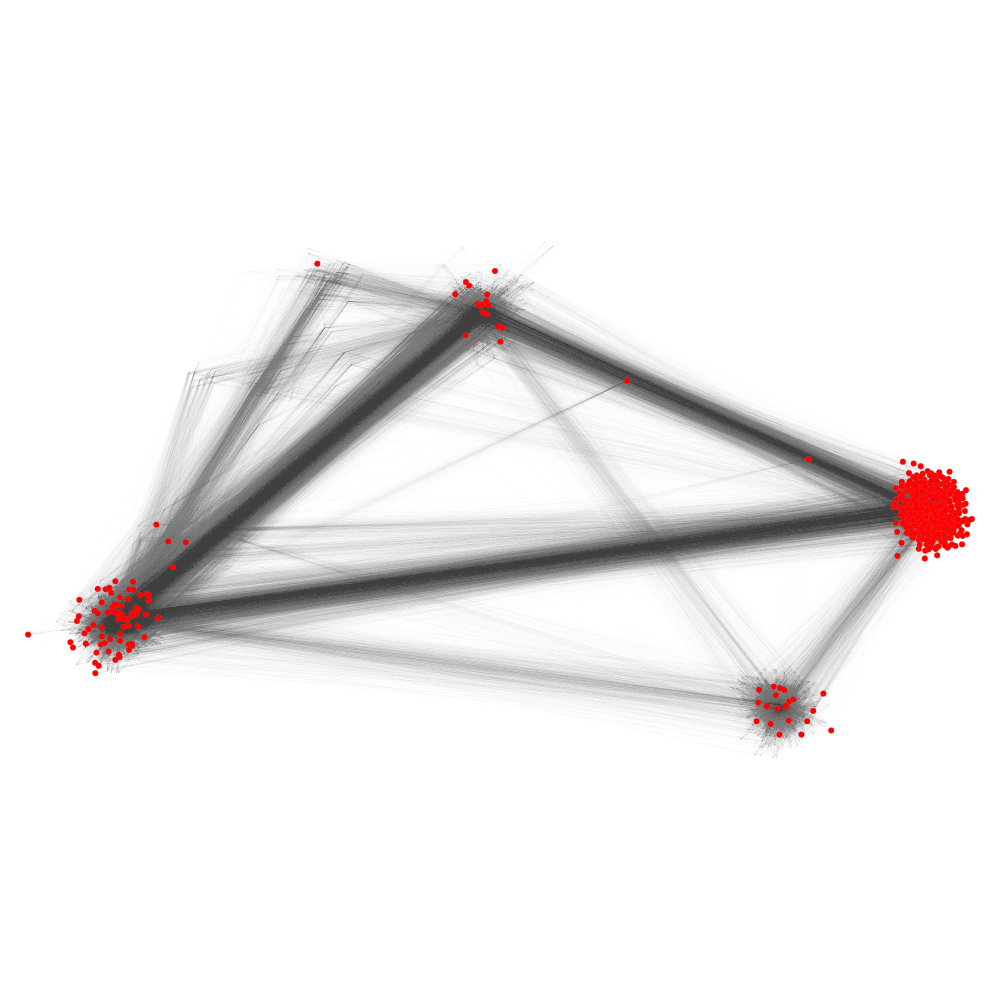

Teleportation parameter:  0.3
precision: 0.8895691154824034
recall:  0.8518660900208234


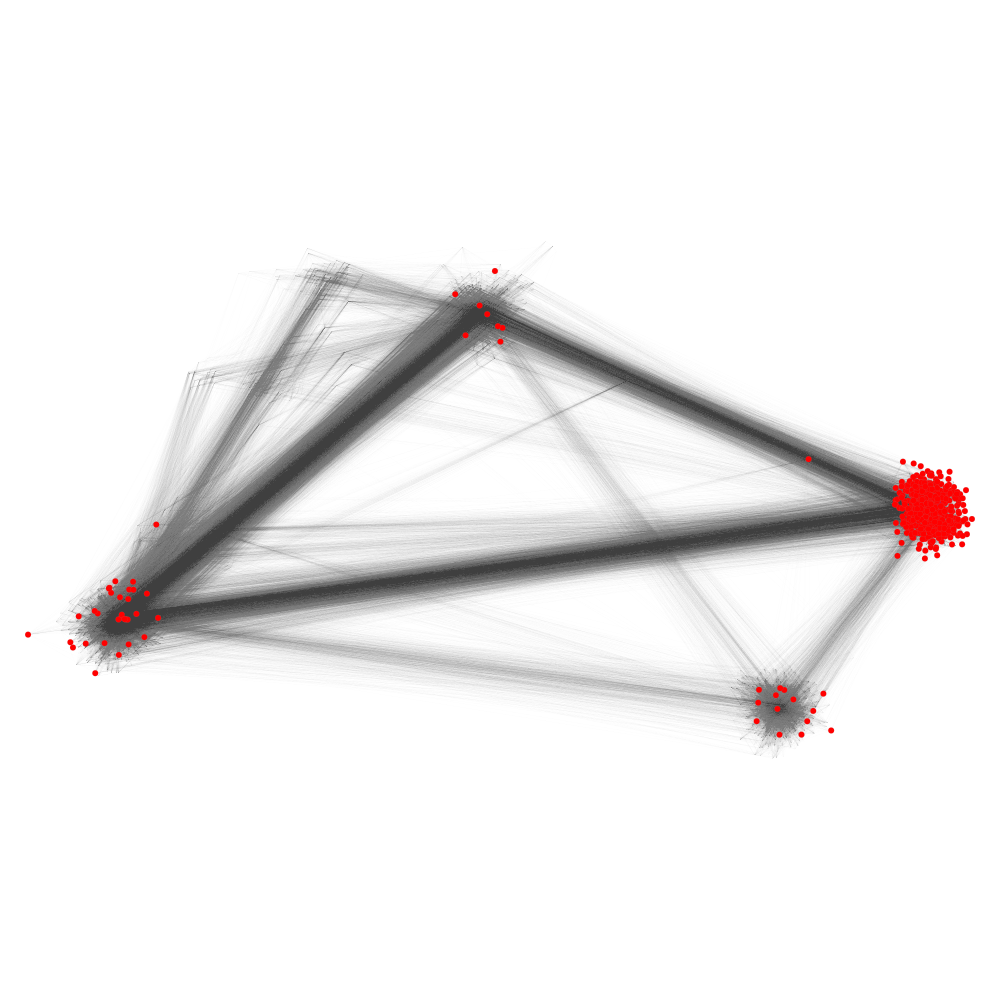

Teleportation parameter:  0.5
precision: 0.9086375697685058
recall:  0.6362646163703348


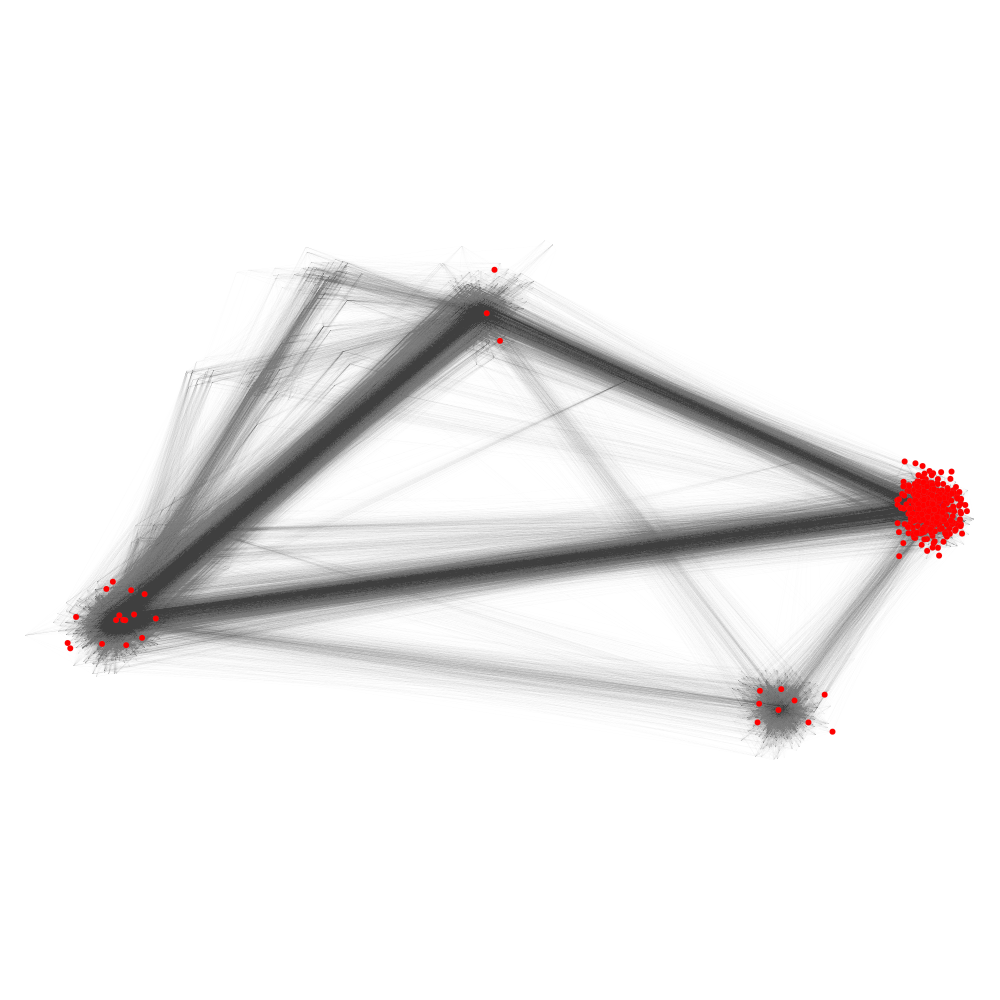

Teleportation parameter:  0.8
precision: 0.9274763682580031
recall:  0.18702546852474772


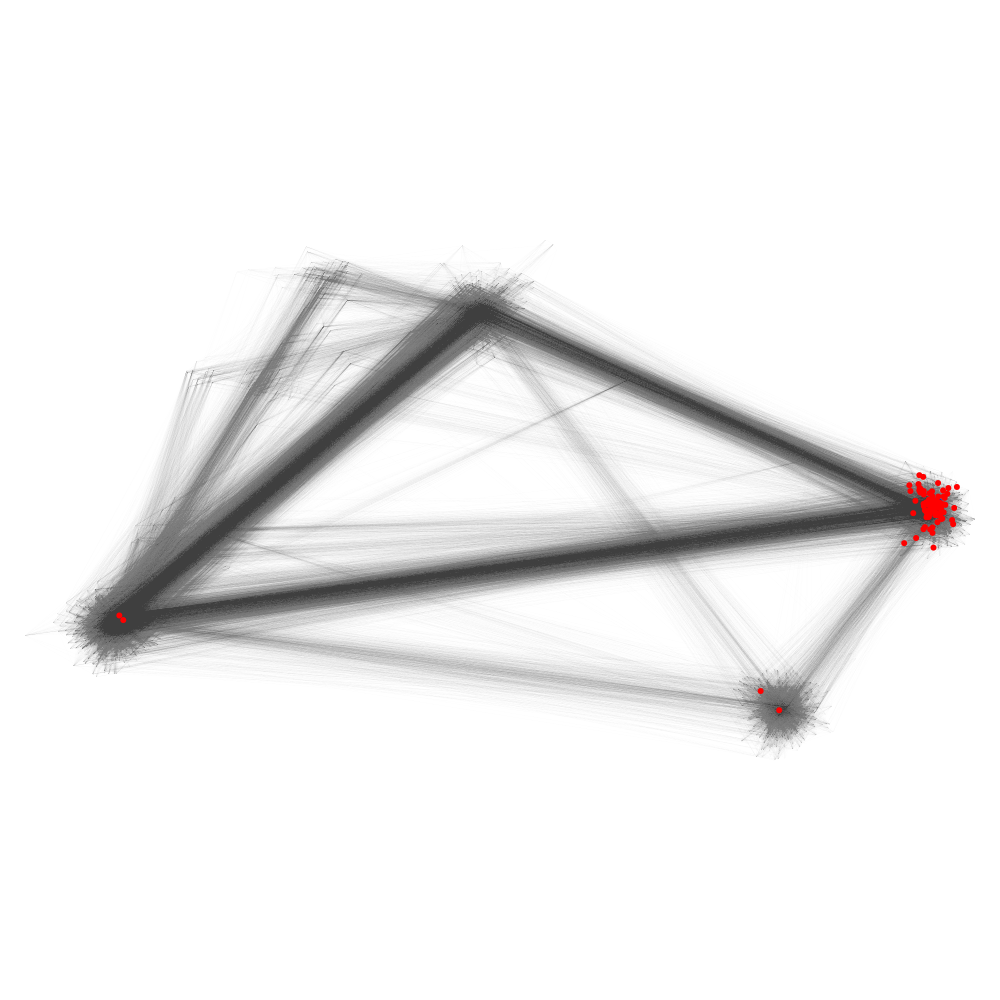

Teleportation parameter:  0.85
precision: 0.9274763682580031
recall:  0.18702546852474772


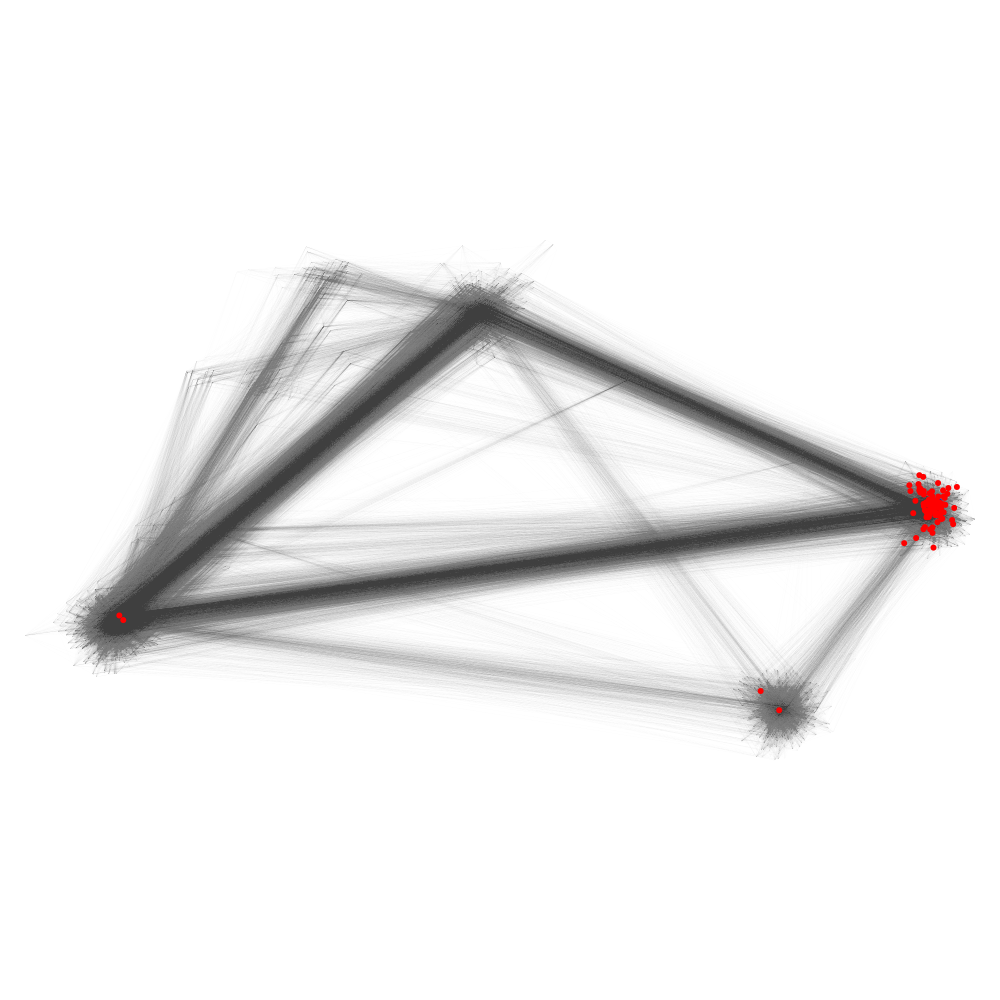

Teleportation parameter:  0.9
precision: 0.9096291679650982
recall:  0.18702546852474772


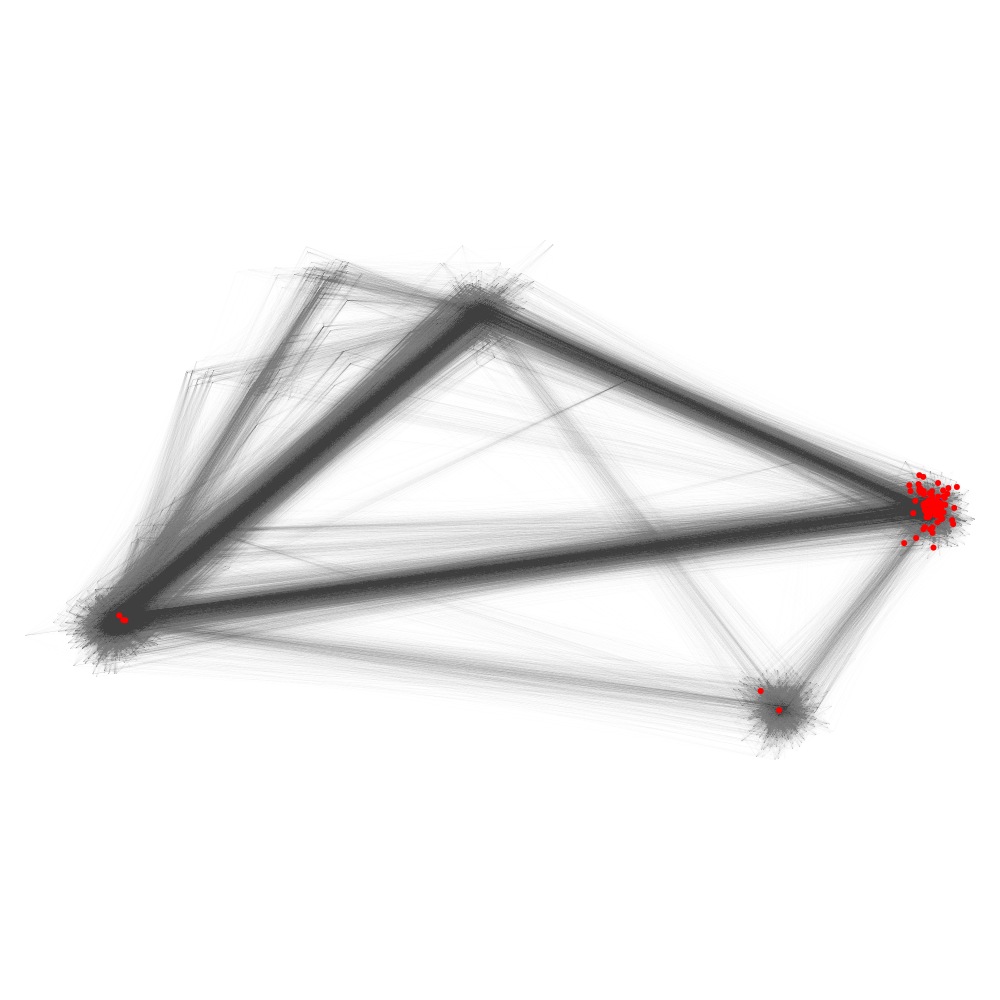

Teleportation parameter:  0.95
precision: 0.9096291679650982
recall:  0.18702546852474772


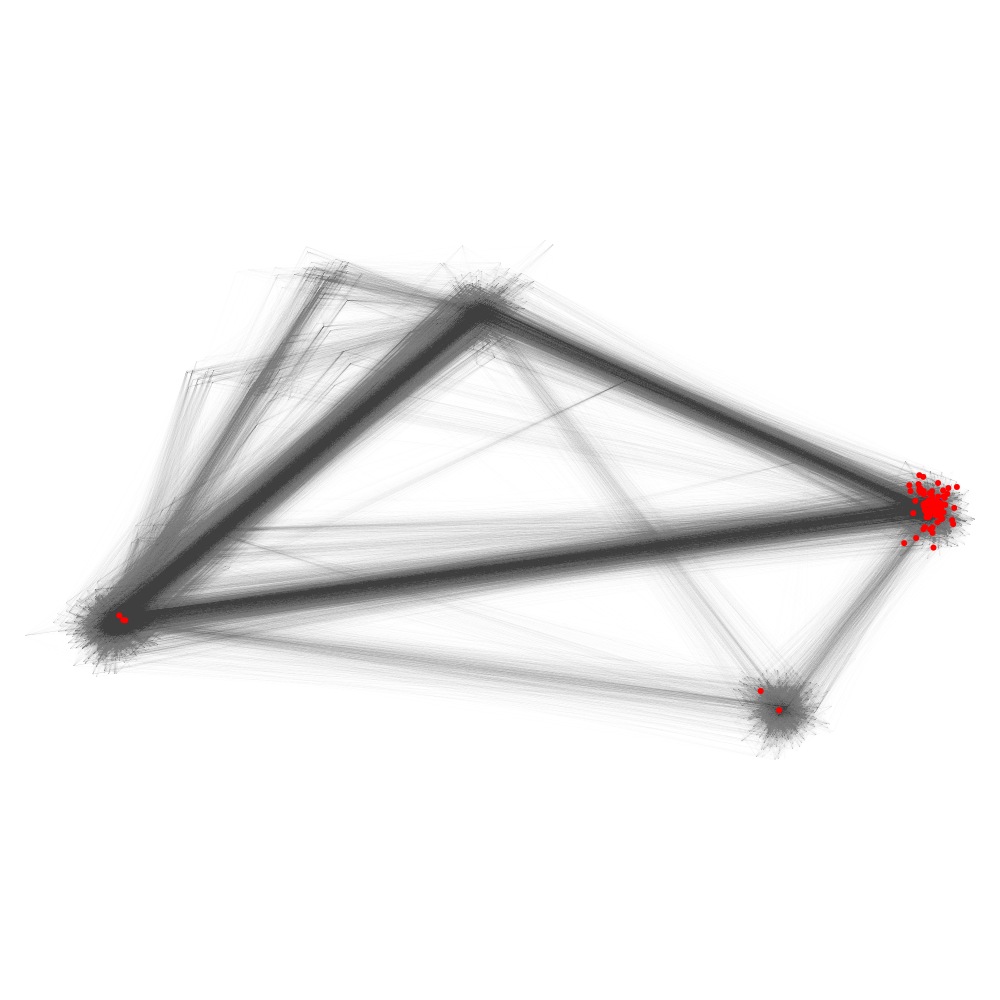

Teleportation parameter:  0.99
precision: 0.8693009118541033
recall:  0.004581130866570559


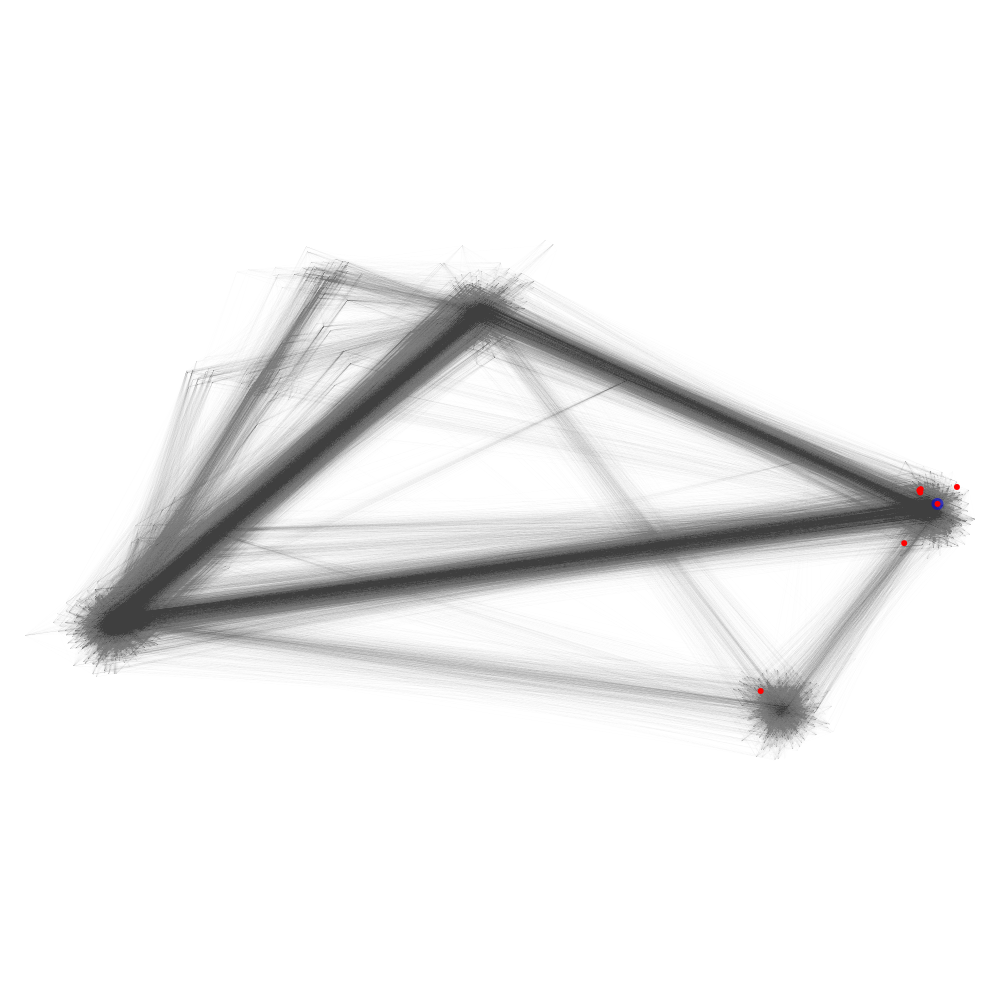

In [7]:
alphas = [1.0e-4,1.0e-3,1.0e-2,1.0e-1,2.0e-1,3.0e-1,5.0e-1,8.0e-1,8.5e-1,9.0e-1,9.5e-1,9.9e-1]

for alpha in alphas:
    
    # Find the solution of L1-regularized PageRank using localized accelerated gradient descent.
    # This method is the fastest among other l1-regularized solvers and other approximate PageRank solvers.
    l1_reg_vector = approximate_PageRank(g,ref_node,alpha = alpha,method="l1reg")
    
    # Call C++ version of sweep cut rounding on the l1-regularized PageRank solution.
    output_sc_fast = sweep_cut(g,l1_reg_vector)
    
    # Extract the partition for g and store it.
    l1_reg_vector_rounded = output_sc_fast[0]

    # Measure accuracy
    true_positives = set(students_2008).intersection(l1_reg_vector_rounded)
    if len(true_positives) == 0:
        true_positives = set(ref_node)
        vol = g.d[ref_node]
    else:
        vol = sum(g.d[l1_reg_vector_rounded])   
    precision_ex = sum(g.d[np.array(list(true_positives))])/vol
    recall_ex = sum(g.d[np.array(list(true_positives))])/sum(g.d[students_2008])
    print("Teleportation parameter: ", alpha)   
    print("precision:", precision_ex)
    print("recall: ", recall_ex)    
    
    # Visualize local partition
    temp = np.zeros(g._num_vertices) + 0.00001

    temp[l1_reg_vector_rounded] = 6

    node_size = g_gtool.new_vertex_property("double",temp)

    temp = ["black" for x in range(g._num_vertices)]

    for i in l1_reg_vector_rounded:
        temp[i] = "red"

    node_colours = g_gtool.new_vertex_property("string",temp)

    halo = np.zeros(g._num_vertices, dtype=bool)
    halo[ref_node] = True
    node_halo = g_gtool.new_vertex_property("bool",halo)

    c_map = plt.get_cmap('autumn') 
    
    graph_draw(g_gtool, pos, output_size=(1000, 1000),
               vertex_size=node_size, 
               vertex_fill_color=node_colours, 
               vertex_halo=node_halo,
               vertex_halo_size = 2.0,
               vorder=node_size,
               edge_pen_width=0.1,
               edge_color = [0.0, 0, 0, 0.05],
               vcmap=c_map)